# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

- Help dealers to determine max - min price of car to quote.

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

In [77]:
import pandas as pd
import numpy as np
import time
from tqdm import tqdm
import matplotlib
import plotly.express as px

import matplotlib.pyplot as plt
import seaborn as sns
#libraries for preprocessing
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler

#libraries for evaluation
from sklearn.metrics import mean_squared_log_error,r2_score,mean_squared_error
from sklearn.model_selection import train_test_split


#libraries for models
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict


import warnings
warnings.filterwarnings('ignore')

In [2]:
cars = pd.read_csv('data/vehicles.csv')

In [3]:
cars.isnull().any()

id              False
region          False
price           False
year             True
manufacturer     True
model            True
condition        True
cylinders        True
fuel             True
odometer         True
title_status     True
transmission     True
VIN              True
drive            True
size             True
type             True
paint_color      True
state           False
dtype: bool

In [4]:
cars.isnull().sum()


id                   0
region               0
price                0
year              1205
manufacturer     17646
model             5277
condition       174104
cylinders       177678
fuel              3013
odometer          4400
title_status      8242
transmission      2556
VIN             161042
drive           130567
size            306361
type             92858
paint_color     130203
state                0
dtype: int64

In [5]:
cars.describe()


,id,price,year,odometer
count,4.268800e+05,4.268800e+05,425675.000000,4.224800e+05
mean,7.311487e+09,7.519903e+04,2011.235191,9.804333e+04
std,4.473170e+06,1.218228e+07,9.452120,2.138815e+05
min,7.207408e+09,0.000000e+00,1900.000000,0.000000e+00
25%,7.308143e+09,5.900000e+03,2008.000000,3.770400e+04
50%,7.312621e+09,1.395000e+04,2013.000000,8.554800e+04
75%,7.315254e+09,2.648575e+04,2017.000000,1.335425e+05
max,7.317101e+09,3.736929e+09,2022.000000,1.000000e+07


In [6]:
cars.corr()

,id,price,year,odometer
id,1.000000,-0.002779,-0.059040,0.010721
price,-0.002779,1.000000,-0.004925,0.010032
year,-0.059040,-0.004925,1.000000,-0.157215
odometer,0.010721,0.010032,-0.157215,1.000000


In [7]:
cars.condition.unique()

array([nan, 'good', 'excellent', 'fair', 'like new', 'new', 'salvage'],
      dtype=object)

In [8]:
cars  = cars.drop_duplicates()

### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

In [9]:
cars = cars.dropna()

In [10]:
cars = cars.query('price > 0')

In [11]:
cars.reset_index(inplace=True,drop=True)

In [12]:
cars

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7316482063,birmingham,4000,2002.0,toyota,echo,excellent,4 cylinders,gas,155000.0,clean,automatic,JTDBT123520243495,fwd,compact,sedan,blue,al
1,7316429417,birmingham,2500,1995.0,bmw,525i,fair,6 cylinders,gas,110661.0,clean,automatic,WBAHD6322SGK86772,rwd,mid-size,sedan,white,al
2,7315946365,birmingham,9000,2008.0,mazda,miata mx-5,excellent,4 cylinders,gas,56700.0,clean,automatic,JM1NC25F570128735,rwd,compact,convertible,white,al
3,7315354216,birmingham,8950,2011.0,ford,f-150,excellent,6 cylinders,gas,164000.0,clean,automatic,1FTMF1CM6BKD55331,fwd,full-size,truck,white,al
4,7315349921,birmingham,4000,1972.0,mercedes-benz,benz,fair,6 cylinders,gas,88100.0,clean,automatic,1.14023E+13,rwd,full-size,coupe,silver,al
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32491,7303314912,wyoming,23495,2015.0,ford,f150 xlt 4x4,like new,8 cylinders,gas,146795.0,clean,automatic,1FTFX1EF5FFC24427,4wd,full-size,truck,black,wy
32492,7303227528,wyoming,12995,2016.0,chevrolet,cruze lt,like new,4 cylinders,gas,61127.0,clean,automatic,1G1BE5SM0G7266569,fwd,compact,sedan,silver,wy
32493,7303114896,wyoming,32999,2014.0,ford,"f350, xlt",excellent,8 cylinders,diesel,154642.0,clean,automatic,1FT8W3DT3EEB41548,4wd,full-size,pickup,brown,wy
32494,7303112347,wyoming,15999,2018.0,chevrolet,"cruze, lt",excellent,4 cylinders,gas,36465.0,clean,automatic,1G1BE5SM7J7133704,fwd,mid-size,sedan,black,wy


### Data Visualization & Analysis

<AxesSubplot:xlabel='decade', ylabel='count'>

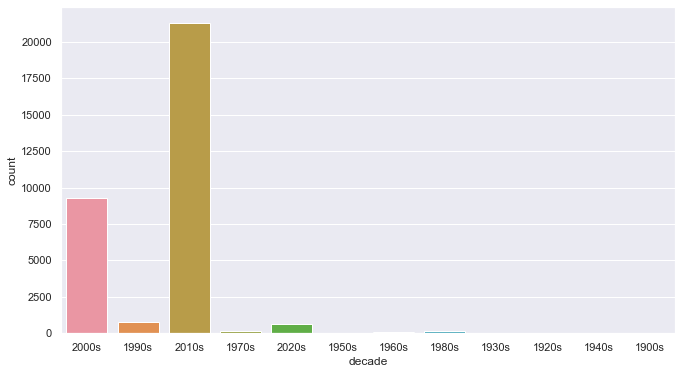

In [13]:
def get_decade(year):
    period_start = int(year/10) * 10
    decade = '{}s'.format(period_start)
    return decade

cars['decade'] = cars['year'].apply(get_decade)
sns.set(rc={'figure.figsize':(11 ,6)})
sns.countplot(cars['decade'])

In [14]:
px.scatter(cars,x='year',y = 'price',color = 'decade')

In [15]:
px.histogram(cars,x = 'year',y = 'price',color='condition',title = 'Price Trend on Basis of Year')

In [16]:
px.histogram(cars,x = 'type',y = 'price',color='decade')

In [17]:
px.histogram(cars,x = 'manufacturer',y = 'price',color='decade')

In [18]:
cars['paint_color'].value_counts()

white     9092
black     5994
silver    4483
grey      3989
blue      3141
red       2900
custom     868
green      842
brown      748
yellow     215
orange     152
purple      72
Name: paint_color, dtype: int64

In [82]:
px.histogram(cars,x = 'paint_color',y = 'price',color='type')

<AxesSubplot:xlabel='type', ylabel='price'>

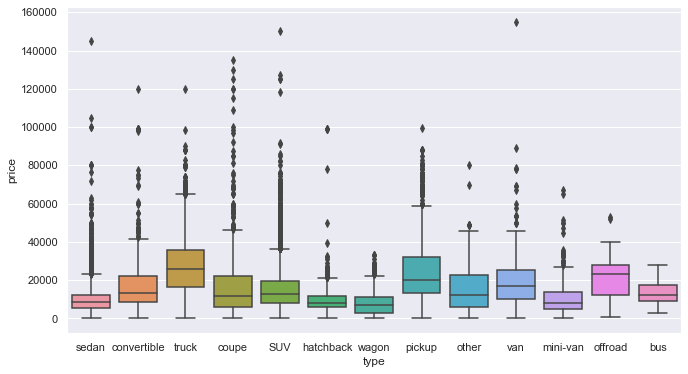

In [20]:
sns.boxplot(x="type", y="price", data=cars)


<AxesSubplot:xlabel='drive', ylabel='price'>

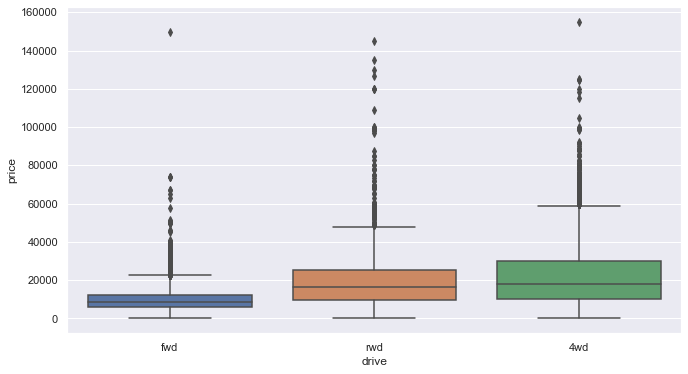

In [21]:
sns.boxplot(x="drive", y="price", data=cars)


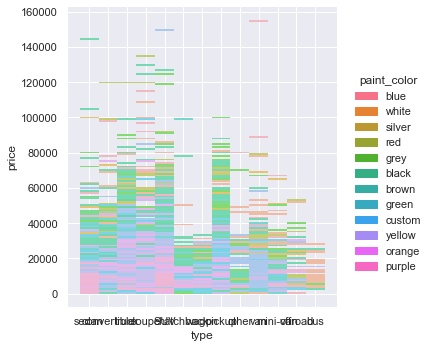

In [22]:
sns.displot(x="type", y="price",hue='paint_color', data=cars)


In [23]:
cars["cylinders"].unique()

array(['4 cylinders', '6 cylinders', '8 cylinders', '5 cylinders',
       '10 cylinders', '3 cylinders', 'other', '12 cylinders'],
      dtype=object)

In [24]:
df = cars

In [25]:
df["cylinders"].replace({"6 cylinders":"6","8 cylinders":"8","4 cylinders":"4", "5 cylinders":"5", "3 cylinders":"3","10 cylinders":"10","12 cylinders":"12","other":"6"}, inplace = True)
df[["cylinders"]] = df[["cylinders"]].astype("int")


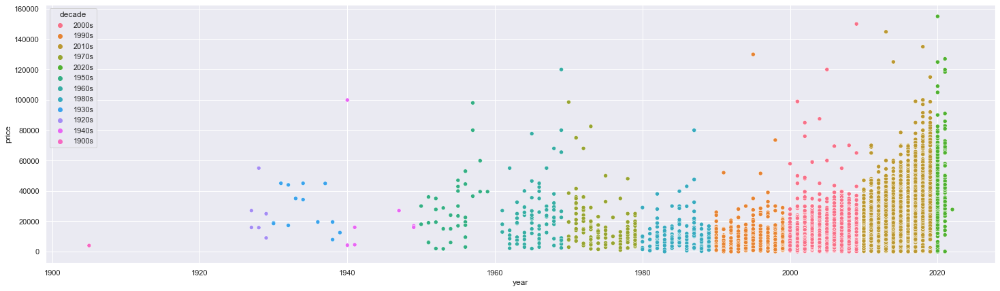

In [26]:
plt.figure(figsize=(25, 7))
ax = plt.subplot()
ax = sns.scatterplot(x="year", y="price", data=df,hue='decade')

### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

In [27]:
#defining numerical and categorical values

num_col=['year','odometer','long','lat']
cat_cols=['region','manufacturer','model','condition','cylinders','fuel','title_status','transmission','drive','size','type','paint_color']


In [28]:
## Split the data to training and test sets, 70/30 split ratio so that we can assess how well the model 
X = df[['year','odometer']]
y = df[['price']]


In [29]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

In [30]:

lr = LinearRegression()
lr

LinearRegression()

In [31]:
lr.fit(X_train,y_train)
lr.coef_[0]

array([ 5.09645859e+02, -1.85837000e-02])

In [32]:
lr.intercept_


array([-1005881.17235554])

In [33]:
y_predicted=lr.predict(X_test)


In [37]:
y_predicted

array([[16545.01835282],
       [15698.05411248],
       [20720.7216462 ],
       ...,
       [15536.32498604],
       [20068.91695263],
       [17362.51531553]])

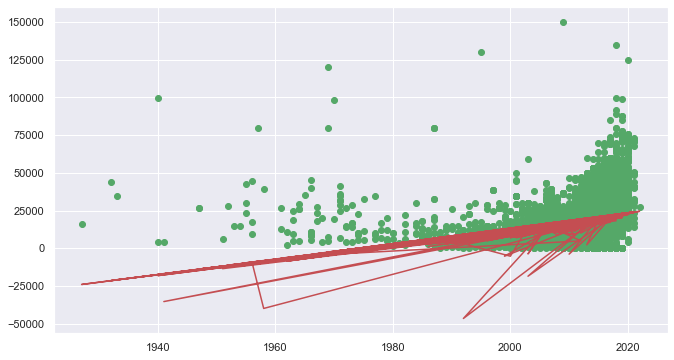

In [35]:
#len(y_train)
plt.scatter(X_test['year'], y_test,color='g') 
plt.plot(X_test['year'], y_predicted,color='r') 
plt.show()



In [38]:
mse = mean_squared_error(y_test['price'], y_predicted
)
print('The mean square error of price and predicted value is: ', mse)

The mean square error of price and predicted value is:  153098137.31179956


(0.0, 40000.0)

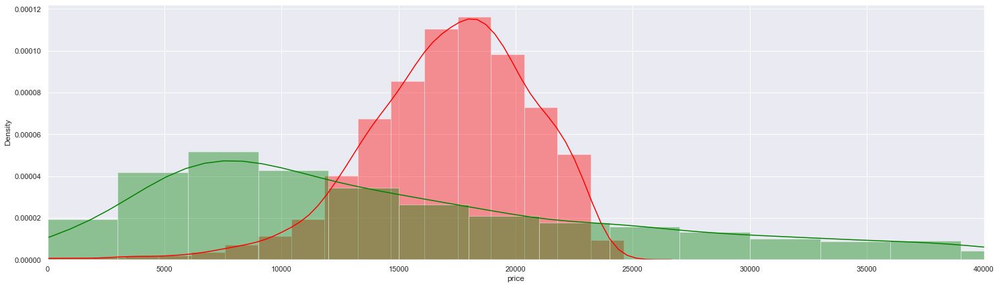

In [39]:
figure = plt.figure(figsize=(25, 7))
sns.distplot(y_predicted, color = "red")
sns.distplot(y_test['price'], color = "green")
plt.xlim(0,40000)

### Hot Enconding Categorigal Features

In [40]:
dum_condition = pd.get_dummies(df['condition']).reset_index()
dum_condition.head()

,index,excellent,fair,good,like new,new,salvage
0,0,1,0,0,0,0,0
1,1,0,1,0,0,0,0
2,2,1,0,0,0,0,0
3,3,1,0,0,0,0,0
4,4,0,1,0,0,0,0


In [41]:
dum_transmission = pd.get_dummies(df['transmission']).reset_index()
dum_transmission.rename(columns = {'other':'other_transmission'}, inplace = True)
dum_transmission.head()

,index,automatic,manual,other_transmission
0,0,1,0,0
1,1,1,0,0
2,2,1,0,0
3,3,1,0,0
4,4,1,0,0


In [42]:
dum_type = pd.get_dummies(df['type']).reset_index()
dum_type.rename(columns = {'other':'other_type'}, inplace =True)
dum_type.head()

,index,SUV,bus,convertible,coupe,hatchback,mini-van,offroad,other_type,pickup,sedan,truck,van,wagon
0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
1,1,0,0,0,0,0,0,0,0,0,1,0,0,0
2,2,0,0,1,0,0,0,0,0,0,0,0,0,0
3,3,0,0,0,0,0,0,0,0,0,0,1,0,0
4,4,0,0,0,1,0,0,0,0,0,0,0,0,0


In [43]:
dum_drive = pd.get_dummies(df['drive']).reset_index()
dum_drive.head()

,index,4wd,fwd,rwd
0,0,0,1,0
1,1,0,0,1
2,2,0,0,1
3,3,0,1,0
4,4,0,0,1


In [44]:
dum_cylinders = pd.get_dummies(df['cylinders']).reset_index()
dum_cylinders.head()

,index,3,4,5,6,8,10,12
0,0,0,1,0,0,0,0,0
1,1,0,0,0,1,0,0,0
2,2,0,1,0,0,0,0,0
3,3,0,0,0,1,0,0,0
4,4,0,0,0,1,0,0,0


In [45]:
dum_fuel = pd.get_dummies(df['fuel']).reset_index()
dum_fuel.head()

,index,diesel,electric,gas,hybrid,other
0,0,0,0,1,0,0
1,1,0,0,1,0,0
2,2,0,0,1,0,0
3,3,0,0,1,0,0
4,4,0,0,1,0,0


In [46]:
dum1 = pd.merge(dum_condition, dum_transmission, on = 'index')
dum1 = pd.merge(dum1, dum_fuel, how = 'inner')
dum1 = pd.merge(dum1, dum_type, how = 'inner')
dum1 = pd.merge(dum1, dum_drive, how = 'inner')
dum1 = pd.merge(dum1, dum_cylinders, how = 'inner')
dum1.head()

,index,excellent,fair,good,like new,new,salvage,automatic,manual,other_transmission,...,4wd,fwd,rwd,3,4,5,6,8,10,12
0,0,1,0,0,0,0,0,1,0,0,...,0,1,0,0,1,0,0,0,0,0
1,1,0,1,0,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,0
2,2,1,0,0,0,0,0,1,0,0,...,0,0,1,0,1,0,0,0,0,0
3,3,1,0,0,0,0,0,1,0,0,...,0,1,0,0,0,0,1,0,0,0
4,4,0,1,0,0,0,0,1,0,0,...,0,0,1,0,0,0,1,0,0,0


In [67]:
df_merged = df[['year','odometer']].reset_index()
df_merged = pd.merge(df_merged, dum1, on = 'index')
df_merged = df_merged.drop(columns = ['index'])
df_merged.head()

,year,odometer,excellent,fair,good,like new,new,salvage,automatic,manual,...,4wd,fwd,rwd,3,4,5,6,8,10,12
0,2002.0,155000.0,1,0,0,0,0,0,1,0,...,0,1,0,0,1,0,0,0,0,0
1,1995.0,110661.0,0,1,0,0,0,0,1,0,...,0,0,1,0,0,0,1,0,0,0
2,2008.0,56700.0,1,0,0,0,0,0,1,0,...,0,0,1,0,1,0,0,0,0,0
3,2011.0,164000.0,1,0,0,0,0,0,1,0,...,0,1,0,0,0,0,1,0,0,0
4,1972.0,88100.0,0,1,0,0,0,0,1,0,...,0,0,1,0,0,0,1,0,0,0


In [48]:
y = df[['price']]


In [49]:
X_train, X_test, y_train, y_test = train_test_split(df_merged, y, test_size = 0.3, random_state = 0)

In [50]:
X_train, X_test, y_train, y_test = train_test_split(df_merged, y, test_size = 0.3, random_state = 0)
lr2 = LinearRegression()
lr2
lr2.fit(X_train, y_train)
lr2.coef_[0]

array([ 5.38211168e+02, -1.96188181e-02, -3.74502123e+02, -4.84063775e+03,
       -1.95842265e+03,  3.14476758e+03,  1.10303051e+04, -7.00151018e+03,
        3.06543816e+03,  5.87533750e+03, -8.94077566e+03,  7.26914947e+03,
        5.58960445e+03, -4.88913199e+03, -2.71209658e+03, -5.25752534e+03,
       -2.00042095e+03, -1.75747074e+03,  4.65427782e+03,  2.53135394e+03,
       -3.72710887e+03, -2.68118657e+03,  4.51679645e+03,  1.58885019e+03,
        1.46898811e+03, -3.73849542e+03,  3.93575224e+03,  1.31759488e+03,
       -6.10893107e+03,  2.12527180e+03, -2.78518876e+03,  6.59916960e+02,
        8.79929330e+02, -2.99441701e+03, -2.97743490e+03, -4.73489171e+02,
        2.60923277e+03, -6.91929996e+02,  3.64810897e+03])

In [51]:
y_predicted_dum = lr2.predict(X_test)
X_test.head(5)

,year,odometer,excellent,fair,good,like new,new,salvage,automatic,manual,...,4wd,fwd,rwd,3,4,5,6,8,10,12
26904,2011.0,133000.0,1,0,0,0,0,0,1,0,...,1,0,0,0,1,0,0,0,0,0
18899,2012.0,206000.0,1,0,0,0,0,0,1,0,...,0,1,0,0,1,0,0,0,0,0
11183,2017.0,72849.0,1,0,0,0,0,0,1,0,...,1,0,0,0,0,0,1,0,0,0
21783,2017.0,99981.0,0,0,0,1,0,0,1,0,...,1,0,0,0,1,0,0,0,0,0
19566,2012.0,89643.0,0,0,1,0,0,0,1,0,...,1,0,0,0,0,0,0,1,0,0


In [52]:
y_test

,price
26904,8500
18899,4950
11183,29900
21783,11995
19566,19999
...,...
26766,35389
29779,16998
21690,33990
16336,12995


In [53]:

mse = mean_squared_error(y_test['price'], y_predicted_dum)
print('The mean square error of price and predicted value is: ', mse)

The mean square error of price and predicted value is:  83522305.85566431


(0.0, 40000.0)

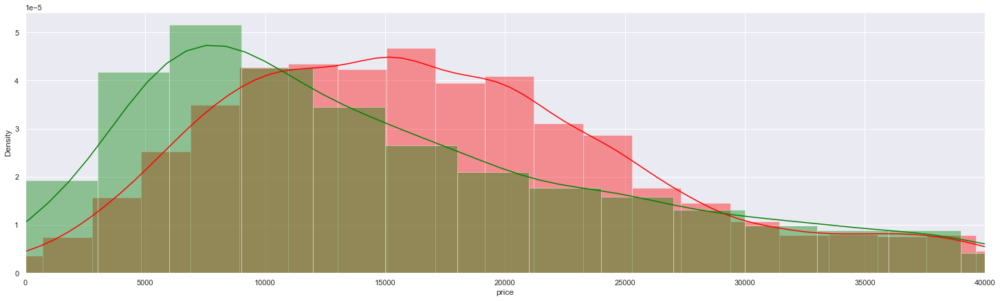

In [54]:
figure = plt.figure(figsize=(25, 7))
sns.distplot(y_predicted_dum, color = "red")
sns.distplot(y_test['price'], color = "green")
plt.xlim(0,40000)

#### Adding Color to dummy variables to see if there is any trend related to paint_color of the vehicle.

In [55]:
dum_color = pd.get_dummies(df['paint_color']).reset_index()
dum_color.head()

,index,black,blue,brown,custom,green,grey,orange,purple,red,silver,white,yellow
0,0,0,1,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,1,0
2,2,0,0,0,0,0,0,0,0,0,0,1,0
3,3,0,0,0,0,0,0,0,0,0,0,1,0
4,4,0,0,0,0,0,0,0,0,0,1,0,0


In [68]:
df_merged_ = df[['year','odometer']].reset_index()

df_merged_color = pd.merge(df_merged_, dum_color)
df_merged_color = df_merged_color.drop(columns = ['index'])
df_merged_color.head()

,year,odometer,black,blue,brown,custom,green,grey,orange,purple,red,silver,white,yellow
0,2002.0,155000.0,0,1,0,0,0,0,0,0,0,0,0,0
1,1995.0,110661.0,0,0,0,0,0,0,0,0,0,0,1,0
2,2008.0,56700.0,0,0,0,0,0,0,0,0,0,0,1,0
3,2011.0,164000.0,0,0,0,0,0,0,0,0,0,0,1,0
4,1972.0,88100.0,0,0,0,0,0,0,0,0,0,1,0,0


In [57]:
X_train, X_test, y_train, y_test = train_test_split(df_merged_color, y, test_size = 0.3, random_state = 0)
lr3 = LinearRegression()
lr3
lr3.fit(X_train, y_train)
lr3.coef_[0]


array([ 4.90533004e+02, -1.82280164e-02,  8.60285168e+02, -1.81314379e+03,
       -1.88545445e+03, -4.39264288e+02, -5.51935577e+02, -2.05647981e+03,
        4.12336624e+03, -1.12635310e+03,  8.41640685e+02, -3.23959938e+03,
        3.17915580e+03,  2.10778250e+03])

In [58]:
y_predicted_color = lr3.predict(X_test)
X_test.head(5)

,year,odometer,black,blue,brown,custom,green,grey,orange,purple,red,silver,white,yellow
26904,2011.0,133000.0,0,0,0,0,0,1,0,0,0,0,0,0
18899,2012.0,206000.0,0,1,0,0,0,0,0,0,0,0,0,0
11183,2017.0,72849.0,0,0,0,0,0,0,0,0,0,0,1,0
21783,2017.0,99981.0,0,0,0,0,0,0,0,0,0,0,1,0
19566,2012.0,89643.0,0,1,0,0,0,0,0,0,0,0,0,0


In [59]:

mse = mean_squared_error(y_test['price'], y_predicted_color)
print('The mean square error of price and predicted value is: ', mse)

The mean square error of price and predicted value is:  147384905.2316834


(0.0, 40000.0)

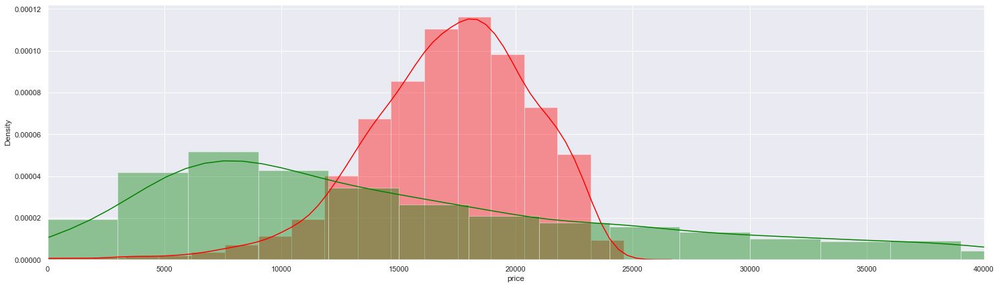

In [60]:
figure = plt.figure(figsize=(25, 7))
sns.distplot(y_predicted, color = "red")
sns.distplot(y_test['price'], color = "green")
plt.xlim(0,40000)

(0.0, 40000.0)

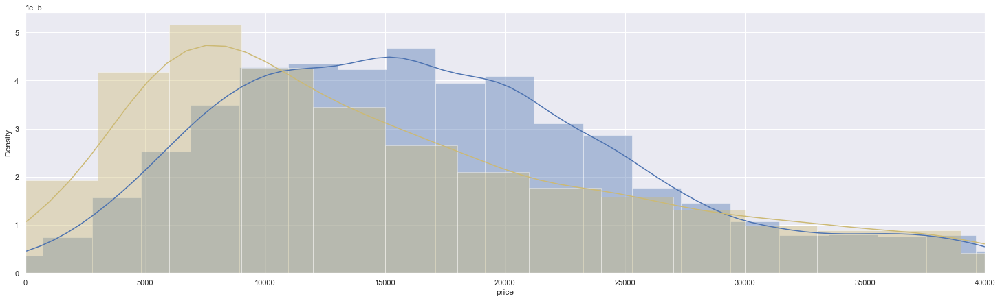

In [61]:
figure = plt.figure(figsize=(25, 7))
sns.distplot(y_predicted_dum, color = "b")
sns.distplot(y_test['price'], color = "y")
plt.xlim(0,40000)

(0.0, 40000.0)

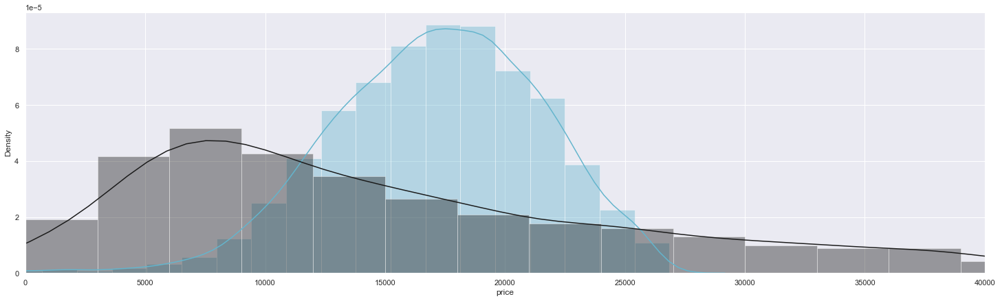

In [62]:
figure = plt.figure(figsize=(25, 7))
sns.distplot(y_predicted_color, color = "c")
sns.distplot(y_test['price'], color = "k")
plt.xlim(0,40000)

### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

### Clearly linear regression model with categorical data is the best fitting.

In [ ]:
#Fine tuning the model by changing the training and testing size

In [69]:
X_data  = df_merged
y_data = df[['price']]

In [70]:
X_data.sample()

,year,odometer,excellent,fair,good,like new,new,salvage,automatic,manual,...,4wd,fwd,rwd,3,4,5,6,8,10,12
10427,2020.0,7164.0,0,0,0,1,0,0,1,0,...,1,0,0,0,0,0,0,1,0,0


In [74]:
X_train_new, X_test_new, y_train_new, y_test_new = train_test_split(X_data, y_data, test_size = 0.4, random_state = 4222)
lre = LinearRegression()
lre.fit(X_train_new, y_train_new)

LinearRegression()

In [75]:
lre.score(X_train_new, y_train_new)


0.5345103734989864

In [79]:
Rcross = cross_val_score(lre, X_data, y_data, cv=4)
Rcross

array([ 0.40761055,  0.51860776,  0.55049364, -0.0722518 ])

In [80]:
price_hat = cross_val_predict(lre, X_train, y_train, cv = 4)
price_hat

array([[20127.19093452],
       [10129.09164934],
       [ 8774.07359321],
       ...,
       [22676.83542495],
       [13177.11375648],
       [15002.07083888]])

(0.0, 40000.0)

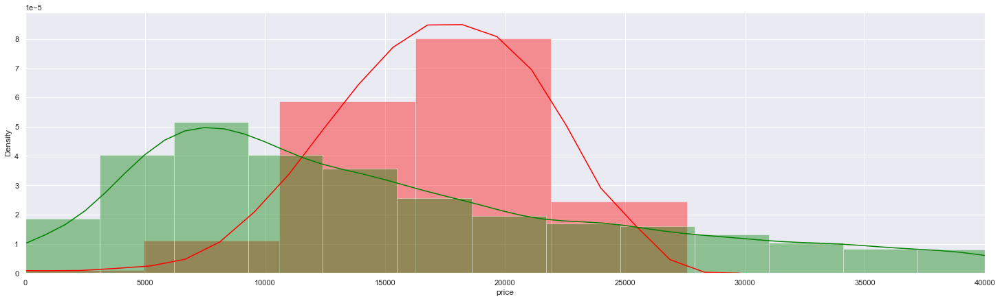

In [81]:
figure = plt.figure(figsize=(25, 7))
sns.distplot(price_hat, color = "red")
sns.distplot(df['price'], color = "green")
plt.xlim(0,40000)

There is data missing, values provided like 0 for price, 0 value for Odometer are not realistic for used cars. 
paint color, odometer , fuel,engine are features that drive the price of the car




### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.